In [ ]:
from google.colab import drive
drive.mount('/content/drive')


Mounted at /content/drive


In [ ]:
import numpy as np
import pandas as pd
import tensorflow as tf
import keras.backend as K
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
import os
import cv2

In [ ]:
dir0 = '/content/drive/MyDrive/dataset/images'
dir1 = '/content/drive/MyDrive/dataset/masks'

In [ ]:
files = []
image_path = []
for dirname, _, filenames in os.walk(dir0):
    for filename in filenames:
        path = os.path.join(dirname, filename)
        image_path.append(path)

        file = filename.split(".")[0]
        files.append(file)

d = {"id": files, "image_path": image_path}
df = pd.DataFrame(data = d)
df = df.set_index('id')
df

,image_path
id,
109_IvanoFrank_2,/content/drive/MyDrive/dataset/images/109_Ivan...
133_IvanoFrank_2,/content/drive/MyDrive/dataset/images/133_Ivan...
110_IvanoFrank_2,/content/drive/MyDrive/dataset/images/110_Ivan...
62_IvanoFrank_2,/content/drive/MyDrive/dataset/images/62_Ivano...
168_IvanoFrank_2,/content/drive/MyDrive/dataset/images/168_Ivan...
...,...
1,/content/drive/MyDrive/dataset/images/1.png
3,/content/drive/MyDrive/dataset/images/3.png
5,/content/drive/MyDrive/dataset/images/5.png


In [ ]:
mfiles = []
mask_path = []
for dirname, _, filenames in os.walk(dir1):
    for filename in filenames:
        path = os.path.join(dirname, filename)
        mask_path.append(path)

        mfile = filename.split(".")[0]
       # car_id = car_id.split("_mask")[0]
        mfiles.append(mfile)


d = {"id": mfiles,"mask_path": mask_path}
mask_df = pd.DataFrame(data = d)
mask_df = mask_df.set_index('id')
mask_df


,mask_path
id,
20,/content/drive/MyDrive/dataset/masks/20.png
167,/content/drive/MyDrive/dataset/masks/167.png
111,/content/drive/MyDrive/dataset/masks/111.png
116_Balak,/content/drive/MyDrive/dataset/masks/116_Balak...
181_Balak,/content/drive/MyDrive/dataset/masks/181_Balak...
...,...
27,/content/drive/MyDrive/dataset/masks/27.png
116_IvanoFrank,/content/drive/MyDrive/dataset/masks/116_Ivano...
58_Jovtneve,/content/drive/MyDrive/dataset/masks/58_Jovtne...


(512, 512)


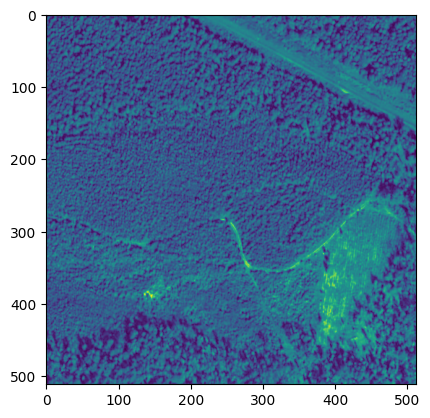

(512, 512)


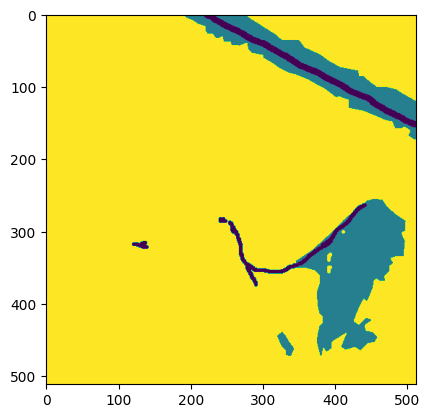

In [ ]:
import cv2
path0='/content/drive/MyDrive/dataset/images/5.png'
img0=cv2.imread(path0,cv2.IMREAD_GRAYSCALE)
shape0=img0.shape
print(shape0)
plt.imshow(img0)
plt.show()

path1='/content/drive/MyDrive/dataset/masks/5.png'
img1=cv2.imread(path1,cv2.IMREAD_GRAYSCALE)
shape1=img1.shape
print(shape1)
plt.imshow(img1)
plt.show()

In [ ]:
df["mask_path"] = mask_df["mask_path"]
df

,image_path,mask_path
id,,
109_IvanoFrank_2,/content/drive/MyDrive/dataset/images/109_Ivan...,/content/drive/MyDrive/dataset/masks/109_Ivano...
133_IvanoFrank_2,/content/drive/MyDrive/dataset/images/133_Ivan...,/content/drive/MyDrive/dataset/masks/133_Ivano...
110_IvanoFrank_2,/content/drive/MyDrive/dataset/images/110_Ivan...,/content/drive/MyDrive/dataset/masks/110_Ivano...
62_IvanoFrank_2,/content/drive/MyDrive/dataset/images/62_Ivano...,/content/drive/MyDrive/dataset/masks/62_IvanoF...
168_IvanoFrank_2,/content/drive/MyDrive/dataset/images/168_Ivan...,/content/drive/MyDrive/dataset/masks/168_Ivano...
...,...,...
1,/content/drive/MyDrive/dataset/images/1.png,/content/drive/MyDrive/dataset/masks/1.png
3,/content/drive/MyDrive/dataset/images/3.png,/content/drive/MyDrive/dataset/masks/3.png
5,/content/drive/MyDrive/dataset/images/5.png,/content/drive/MyDrive/dataset/masks/5.png


In [ ]:

n = len(df)
print(n)
test_df = df.iloc[(n//10)*3:(n//10)*4]
print(test_df)

322
                                                         image_path  \
id                                                                    
136_IvanoFrank    /content/drive/MyDrive/dataset/images/136_Ivan...   
127_IvanoFrank_2  /content/drive/MyDrive/dataset/images/127_Ivan...   
102_IvanoFrank    /content/drive/MyDrive/dataset/images/102_Ivan...   
175_IvanoFrank    /content/drive/MyDrive/dataset/images/175_Ivan...   
146_IvanoFrank    /content/drive/MyDrive/dataset/images/146_Ivan...   
145_IvanoFrank    /content/drive/MyDrive/dataset/images/145_Ivan...   
117_IvanoFrank    /content/drive/MyDrive/dataset/images/117_Ivan...   
120_Balak         /content/drive/MyDrive/dataset/images/120_Bala...   
154_IvanoFrank    /content/drive/MyDrive/dataset/images/154_Ivan...   
118_IvanoFrank    /content/drive/MyDrive/dataset/images/118_Ivan...   
152_IvanoFrank    /content/drive/MyDrive/dataset/images/152_Ivan...   
181_Balak         /content/drive/MyDrive/dataset/images/181_Bala...   
10

Total samples in dataset: 322


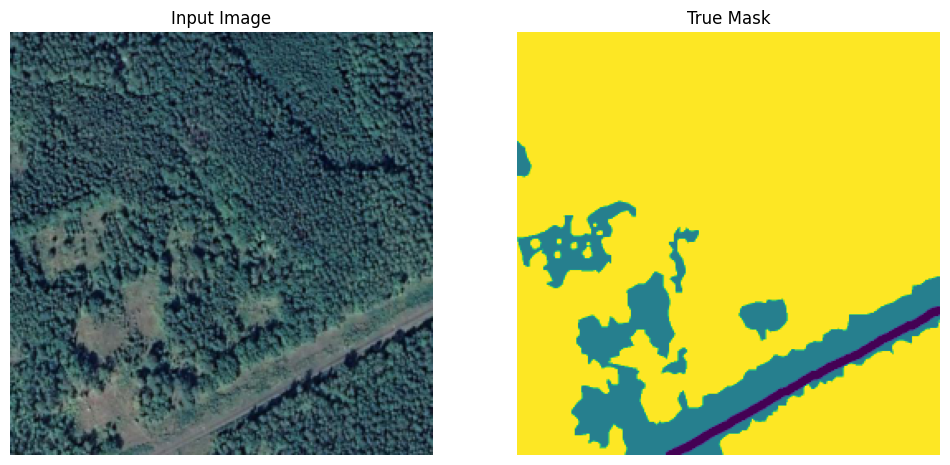

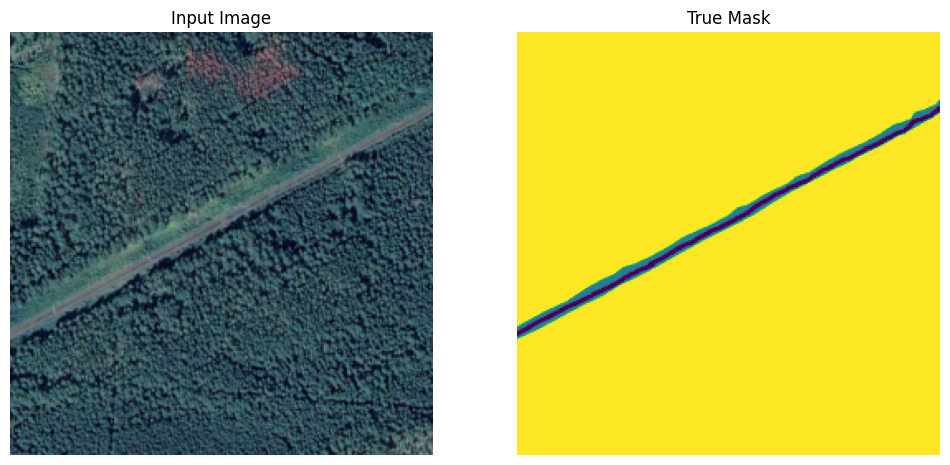

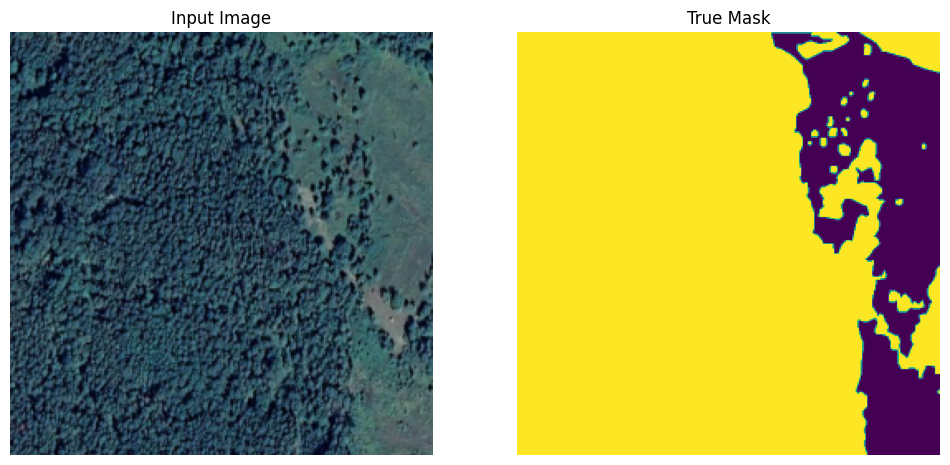

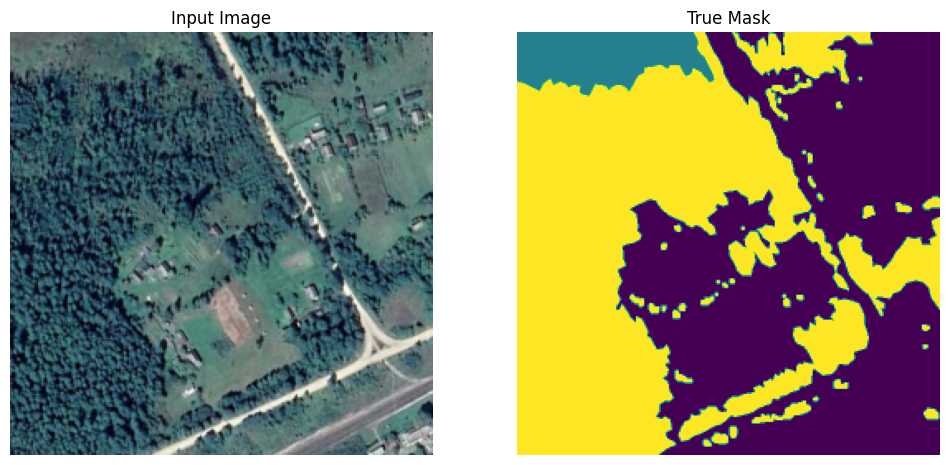

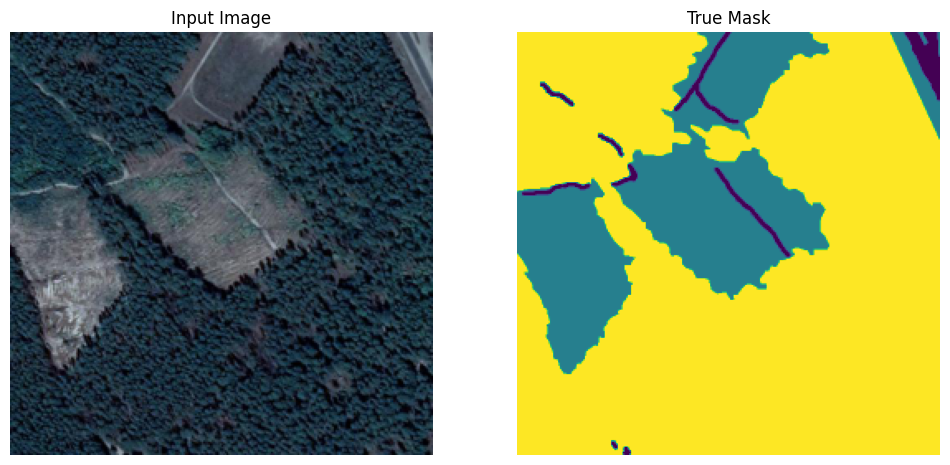

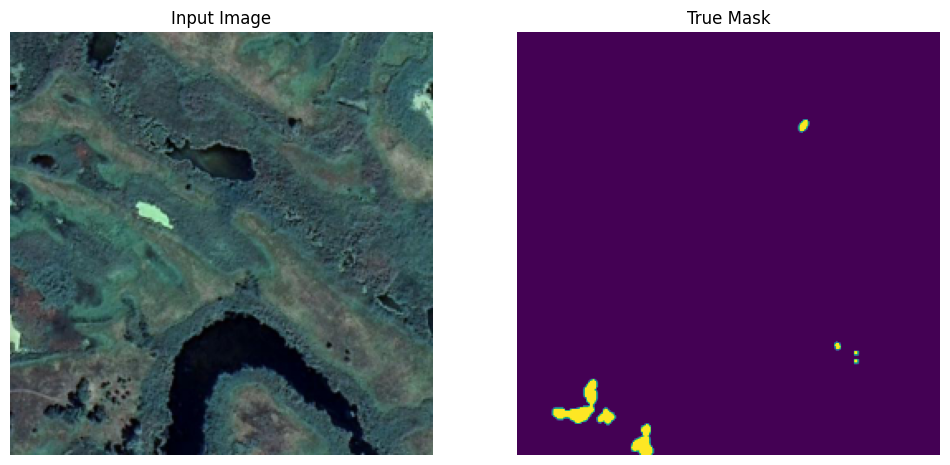

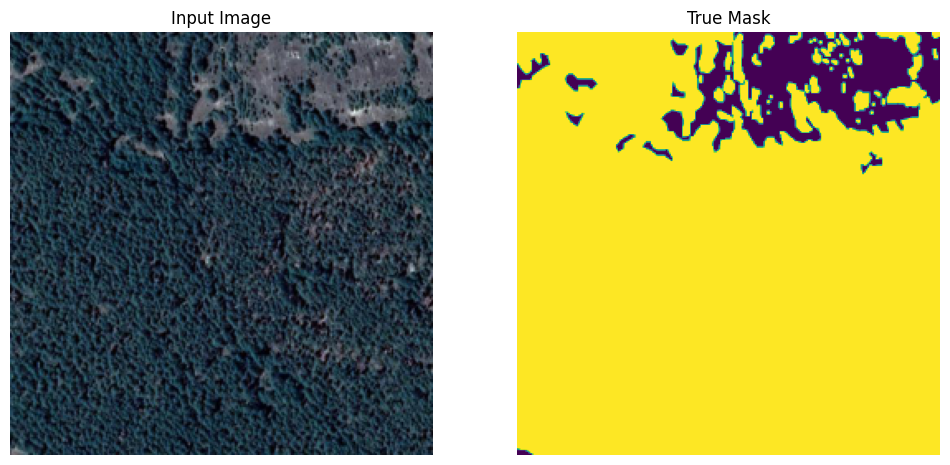

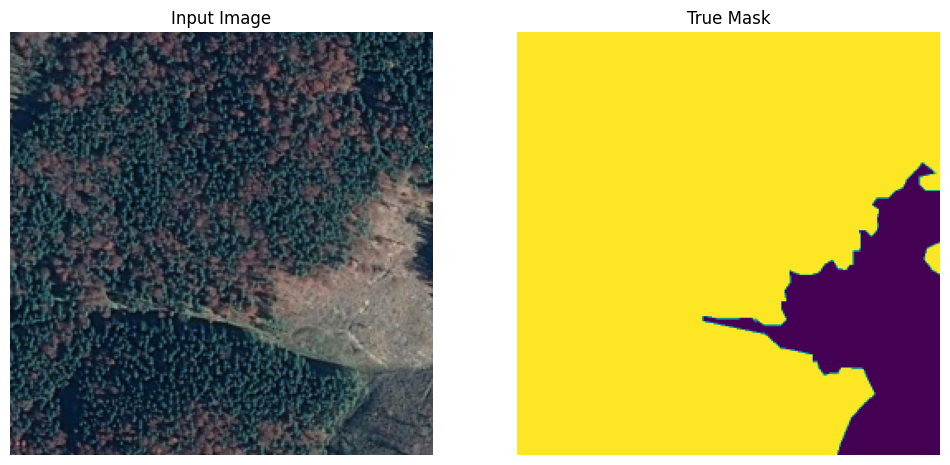

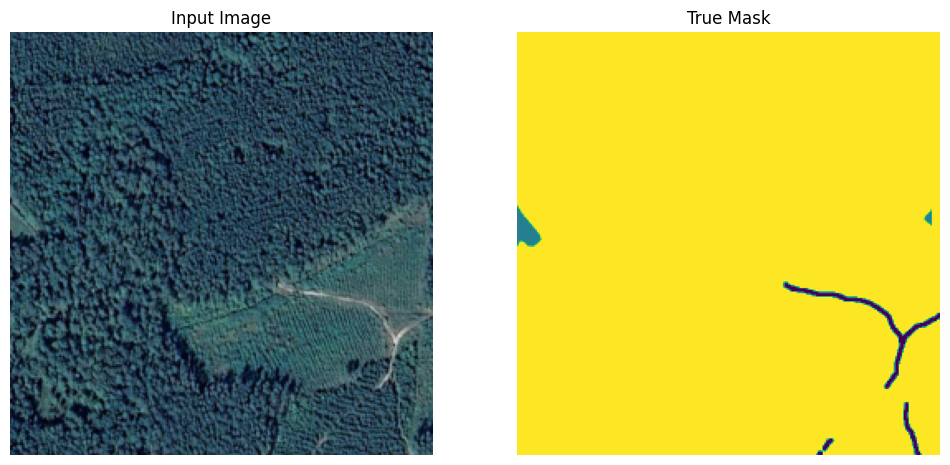

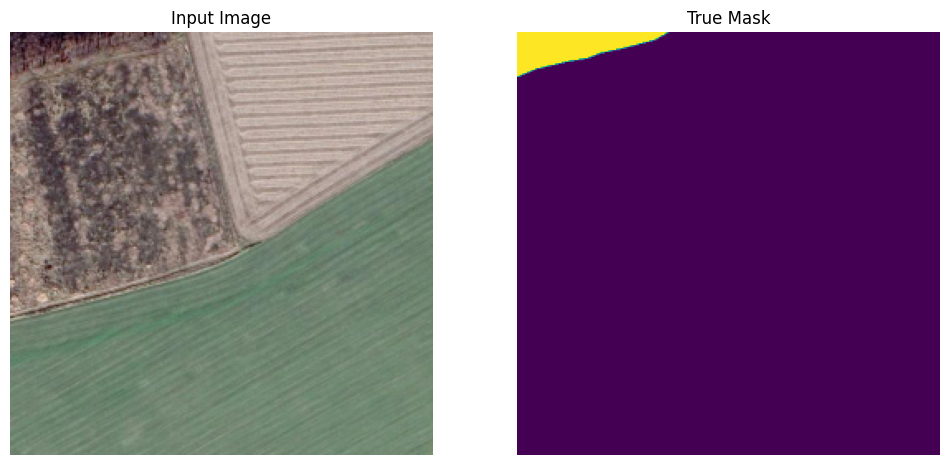

In [ ]:
import tensorflow as tf
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
import pandas as pd
import os

# Define image size
img_size = [256, 256]

# Data augmentation function
def data_augmentation(car_img, mask_img):
    if tf.random.uniform(()) > 0.5:
        car_img = tf.image.flip_left_right(car_img)
        mask_img = tf.image.flip_left_right(mask_img)
    return car_img, mask_img

# Preprocessing function
def preprocessing(image_path, mask_path):
    car_img = tf.io.read_file(image_path)
    car_img = tf.image.decode_png(car_img, channels=3)
    car_img = tf.image.resize(car_img, img_size)
    car_img = tf.cast(car_img, tf.float32) / 255.0

    mask_img = tf.io.read_file(mask_path)
    mask_img = tf.image.decode_png(mask_img, channels=1)  # Ensure mask is single-channel
    mask_img = tf.image.resize(mask_img, img_size)
    mask_img = tf.cast(mask_img, tf.float32) / 255.0  # Normalize mask

    return car_img, mask_img

# Function to create dataset
def create_dataset(df, train=False):
    ds = tf.data.Dataset.from_tensor_slices((df["image_path"].values, df["mask_path"].values))
    ds = ds.map(preprocessing, num_parallel_calls=tf.data.AUTOTUNE)
    if train:
        ds = ds.map(data_augmentation, num_parallel_calls=tf.data.AUTOTUNE)
    return ds

# Create DataFrame from directories
def create_dataframe(dir0, dir1):
    files = []
    image_path = []
    for dirname, _, filenames in os.walk(dir0):
        for filename in filenames:
            path = os.path.join(dirname, filename)
            image_path.append(path)
            file = filename.split(".")[0]
            files.append(file)

    d = {"id": files, "image_path": image_path}
    df = pd.DataFrame(data=d)
    df = df.set_index('id')

    mfiles = []
    mask_path = []
    for dirname, _, filenames in os.walk(dir1):
        for filename in filenames:
            path = os.path.join(dirname, filename)
            mask_path.append(path)
            mfile = filename.split(".")[0]
            mfiles.append(mfile)

    d = {"id": mfiles, "mask_path": mask_path}
    mask_df = pd.DataFrame(data=d)
    mask_df = mask_df.set_index('id')

    df["mask_path"] = mask_df["mask_path"]
    return df


# Create DataFrame
df = create_dataframe(dir0, dir1)

# Check dataset size
print("Total samples in dataset:", len(df))

# Split data into train, validation, and test sets
train_df, temp_df = train_test_split(df, random_state=42, test_size=0.25)
valid_df, test_df = train_test_split(temp_df, random_state=42, test_size=0.5)

# Create datasets
train = create_dataset(train_df, train=True)
valid = create_dataset(valid_df)
test = create_dataset(test_df)

# Dataset parameters
TRAIN_LENGTH = len(train_df)
BATCH_SIZE = 16
BUFFER_SIZE = 322

# Batch and prefetch datasets
train_dataset = train.cache().shuffle(BUFFER_SIZE).batch(BATCH_SIZE).repeat()
train_dataset = train_dataset.prefetch(buffer_size=tf.data.AUTOTUNE)
valid_dataset = valid.batch(BATCH_SIZE)
test_dataset = test.batch(BATCH_SIZE)

# Display function for checking masks
def display(display_list):
    plt.figure(figsize=(12, 12))
    title = ['Input Image', 'True Mask']

    for i in range(len(display_list)):
        plt.subplot(1, len(display_list), i + 1)
        plt.title(title[i])
        if i == 0:
            plt.imshow(display_list[i])
        else:
            plt.imshow(display_list[i])  # Ensure mask is displayed in grayscale
        plt.axis('off')
    plt.show()

# Display some samples to check
for image, mask in train.take(10):
    display([image.numpy(), mask.numpy()])


In [ ]:
base_model = tf.keras.applications.MobileNetV2(input_shape=[256, 256, 3], include_top=False)

# Use the activations of these layers
layer_names = [
    'block_1_expand_relu',   # 64x64
    'block_3_expand_relu',   # 32x32
    'block_6_expand_relu',   # 16x16
    'block_13_expand_relu',  # 8x8
    'block_16_project',      # 4x4
]
base_model_outputs = [base_model.get_layer(name).output for name in layer_names]

# Create the feature extraction model
down_stack = tf.keras.Model(inputs=base_model.input, outputs=base_model_outputs)
down_stack.trainable = True

In [ ]:
def upsample(filters, size, norm_type='batchnorm', apply_dropout=False):
    initializer = tf.random_normal_initializer(0., 0.02)

    result = tf.keras.Sequential()
    result.add(
      tf.keras.layers.Conv2DTranspose(filters, size, strides=2,
                                      padding='same',
                                      kernel_initializer=initializer,
                                      use_bias=False))

    if norm_type.lower() == 'batchnorm':
        result.add(tf.keras.layers.BatchNormalization())
    elif norm_type.lower() == 'instancenorm':
        result.add(InstanceNormalization())

    if apply_dropout:
        result.add(tf.keras.layers.Dropout(0.5))

        result.add(tf.keras.layers.ReLU())

    return result

up_stack = [
    upsample(512, 3),  # 4x4 -> 8x8
    upsample(256, 3),  # 8x8 -> 16x16
    upsample(128, 3),  # 16x16 -> 32x32
    upsample(64, 3),   # 32x32 -> 64x64
]

In [ ]:

def unet_model(output_channels):
    inputs = tf.keras.layers.Input(shape=[256, 256, 3])

    # Downsampling through the model
    skips = down_stack(inputs)
    x = skips[-1]
    skips = reversed(skips[:-1])

  # Upsampling and establishing the skip connections
    for up, skip in zip(up_stack, skips):
        x = up(x)
        concat = tf.keras.layers.Concatenate()
        x = concat([x, skip])

  # This is the last layer of the model
    last = tf.keras.layers.Conv2DTranspose(
      output_channels, 3, strides=2, activation='sigmoid',
      padding='same')  #64x64 -> 128x128

    x = last(x)

    return tf.keras.Model(inputs=inputs, outputs=x)

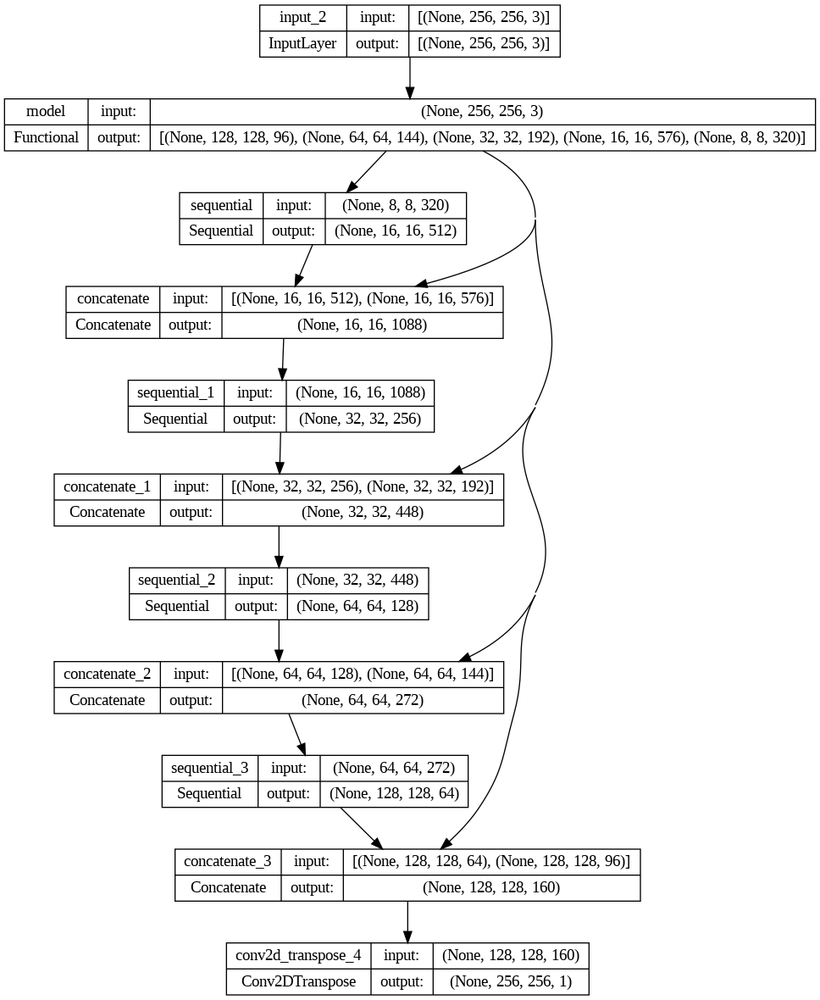

In [ ]:
def dice_coef(y_true, y_pred, smooth=1):
    intersection = K.sum(y_true * y_pred, axis=[1,2,3])
    union = K.sum(y_true, axis=[1,2,3]) + K.sum(y_pred, axis=[1,2,3])
    return K.mean( (2. * intersection + smooth) / (union + smooth), axis=0)

def dice_loss(in_gt, in_pred):
    return 1-dice_coef(in_gt, in_pred)

model = unet_model(1)

model.compile(optimizer='adam',
              loss = dice_loss,
              metrics=[dice_coef,'binary_accuracy'])

tf.keras.utils.plot_model(model, show_shapes=True)


In [ ]:
def visualize(display_list):
    plt.figure(figsize=(12,12))
    title = ['Input Image', 'True Mask', 'Predicted Mask']
    for i in range(len(display_list)):
        plt.subplot(1, len(display_list), i+1)
        plt.title(title[i])
        plt.imshow(tf.keras.preprocessing.image.array_to_img(display_list[i]))
        plt.axis('off')
    plt.show()

def show_predictions(sample_image, sample_mask):
    pred_mask = model.predict(sample_image[tf.newaxis, ...])
    pred_mask = pred_mask.reshape(img_size[0],img_size[1],1)
    visualize([sample_image, sample_mask, pred_mask])

1/1 [==============================] - 1s 1s/step


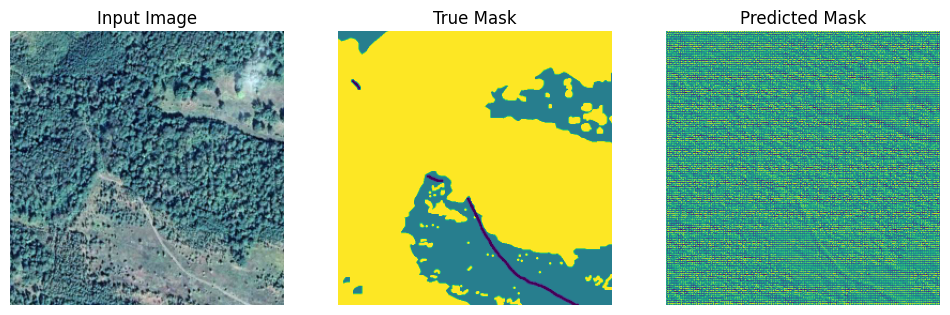

1/1 [==============================] - 0s 190ms/step


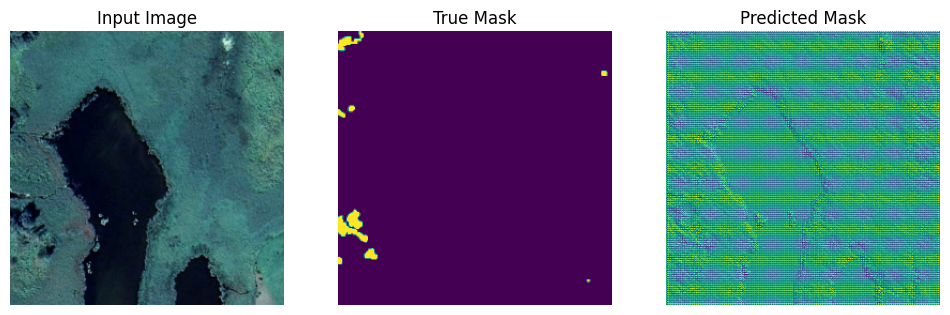

1/1 [==============================] - 0s 258ms/step


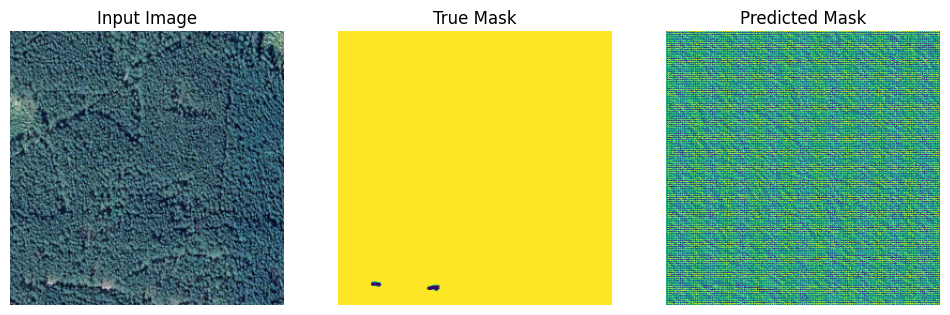

1/1 [==============================] - 0s 277ms/step


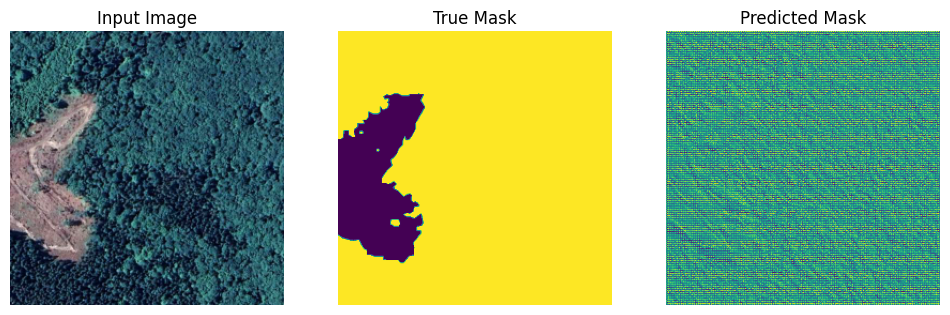

1/1 [==============================] - 0s 373ms/step


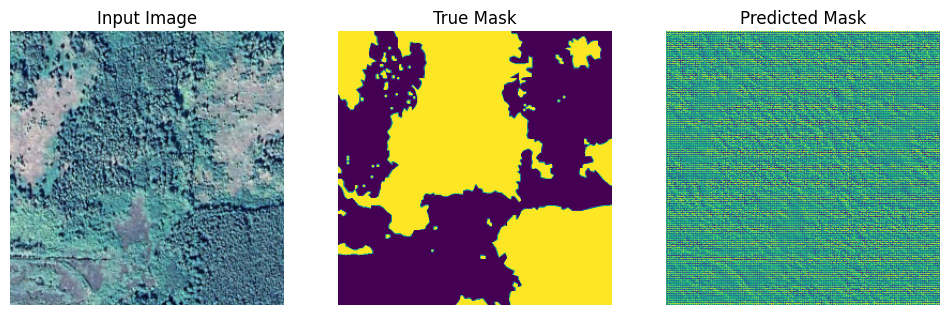

1/1 [==============================] - 0s 281ms/step


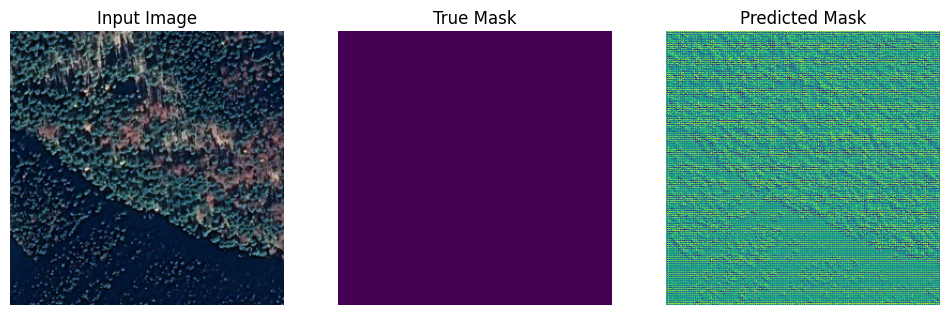

1/1 [==============================] - 0s 346ms/step


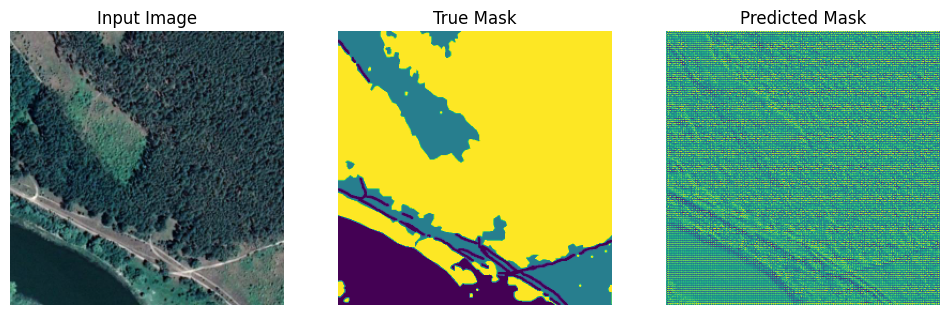

1/1 [==============================] - 0s 383ms/step


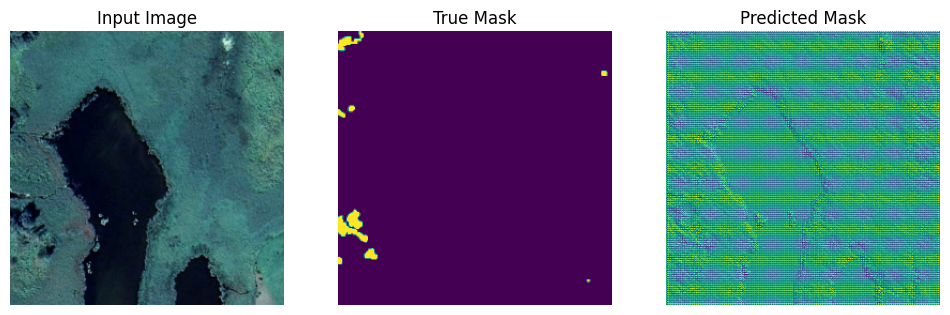

1/1 [==============================] - 0s 201ms/step


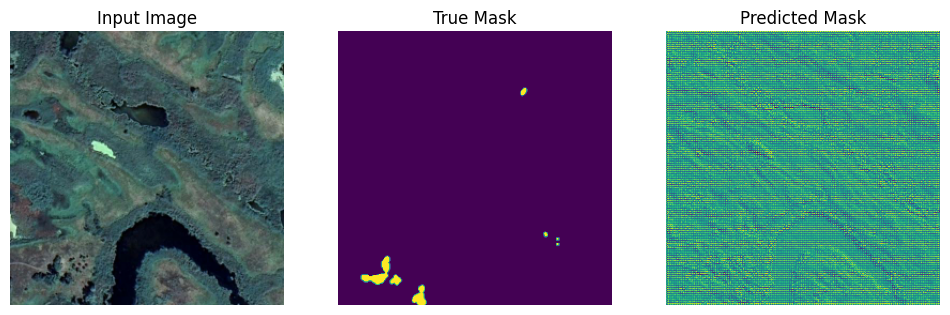

1/1 [==============================] - 0s 296ms/step


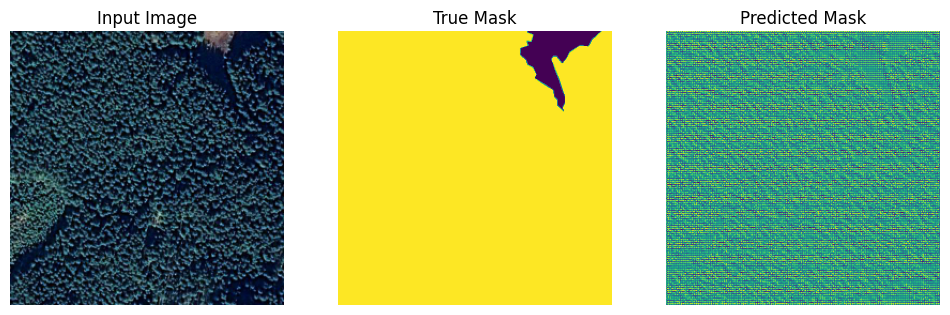

In [ ]:
for i in range(5):
    for images, masks in train_dataset.take(i):
        for img, mask in zip(images, masks):
            sample_image = img
            sample_mask = mask
            show_predictions(sample_image, sample_mask)
            break